In [1]:
import cv2
import PIL
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [2]:

import pathlib
data_dir = pathlib.Path('./')
data_dir


WindowsPath('.')

In [3]:
#total images before dataset augumentation
image_count = len(list(data_dir.glob('*/*.jpg')))
image_count
back  = list(data_dir.glob('back/*'))


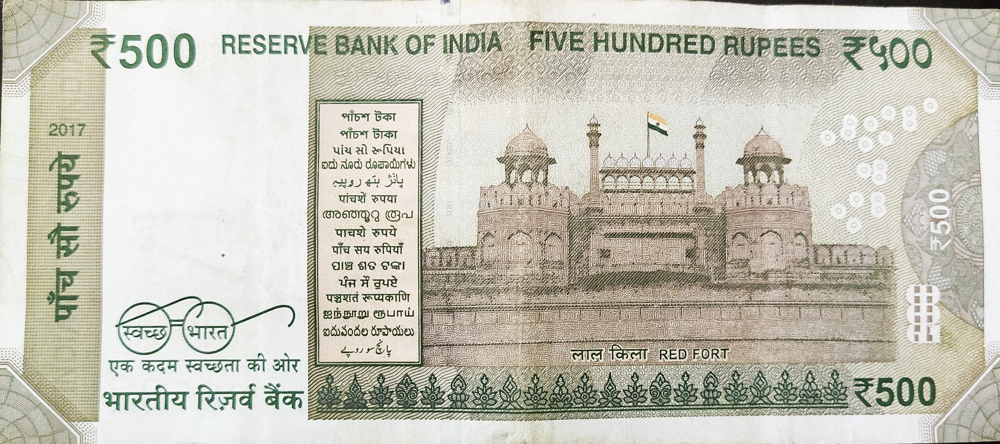

In [4]:
PIL.Image.open(str(back[0]))

In [5]:
note_path_dict = {
    'real_front' : list(data_dir.glob('front/*')),
    'real_back'  : list(data_dir.glob('back/*')),
    'fake_back'  : list(data_dir.glob('test/back/*')),
    'fake_front' : list(data_dir.glob('test/front/*'))
}


In [6]:
img = cv2.imread(str(note_path_dict['fake_front'][1]))
img.shape

(1523, 3398, 3)

(100, 100, 3)

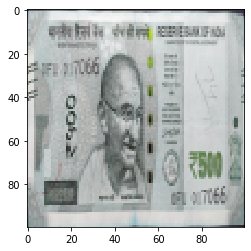

In [7]:
r = cv2.resize(img, (100, 100),fx = 0.3, fy = 0.3,interpolation = cv2.INTER_AREA)
plt.imshow(r)
r.shape

In [8]:
x,y = [], []
for notes, num in note_path_dict.items():
    for image in num:
        img = cv2.imread(str(image))
        resized_img = cv2.resize(img, (300,300),fx = 0.1, fy = 0.1,interpolation = cv2.INTER_AREA)
        x.append(resized_img)
        if(notes == 'real_front' or notes == 'real_back'):
            y.append(1)
        else:
            y.append(0)

(53, 300, 300, 3)

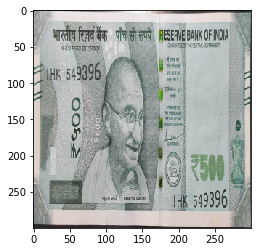

In [9]:
y = np.array(y)
x = np.array(x)
plt.imshow(x[7])
x.shape

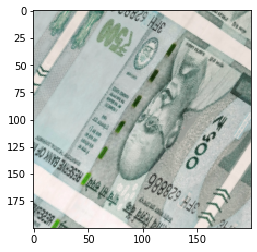

In [10]:
# data_augmentation = keras.Sequential(
#   [
#     layers.experimental.preprocessing.RandomFlip("horizontal", 
#                                                  input_shape=(img_height, 
#                                                               img_width,
#                                                               3)),
#     layers.experimental.preprocessing.RandomRotation(0.1),
#     layers.experimental.preprocessing.RandomZoom(0.1),
#   ]
# )
img_width, img_height = 200,200
resize_rescale = tf.keras.Sequential([
            layers.experimental.preprocessing.Resizing(img_width, img_height),
            layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
            layers.experimental.preprocessing.RandomRotation(0.2),
 ])
results = resize_rescale(x)[50].numpy().astype('uint8')
plt.imshow(results) 


TypeError: Invalid shape (3710, 200, 200, 3) for image data

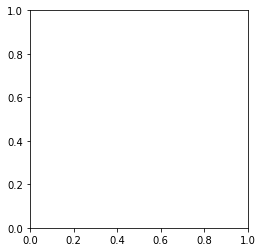

In [12]:
# add image to batch
x_aug = []
for j in range(len(x)):
    for i in range(70):
        x_aug.append(resize_rescale(x)[j].numpy().astype('uint8'))
x_aug = np.array(x_aug)
x_aug.shape


(3710, 200, 200, 3)

In [15]:
y_aug = []
for k in range(len(x_aug)):
    if(k <33*70):
        y_aug.append(1)
    else:
        y_aug.append(0)
y_aug = np.array(y_aug)
y_aug[31*60]
x_aug[0]

array([[[211, 218, 221],
        [214, 220, 222],
        [216, 221, 224],
        ...,
        [217, 222, 222],
        [216, 222, 221],
        [212, 218, 218]],

       [[206, 214, 218],
        [210, 217, 221],
        [212, 218, 221],
        ...,
        [216, 222, 221],
        [216, 222, 221],
        [211, 218, 217]],

       [[205, 213, 217],
        [209, 215, 219],
        [210, 217, 221],
        ...,
        [212, 219, 218],
        [219, 224, 223],
        [210, 217, 217]],

       ...,

       [[212, 218, 222],
        [213, 219, 223],
        [212, 218, 222],
        ...,
        [197, 202, 200],
        [195, 201, 198],
        [190, 197, 193]],

       [[212, 218, 222],
        [212, 218, 223],
        [211, 216, 222],
        ...,
        [204, 209, 206],
        [194, 200, 197],
        [185, 192, 189]],

       [[213, 219, 223],
        [212, 218, 223],
        [208, 215, 219],
        ...,
        [205, 210, 207],
        [198, 203, 201],
        [193, 199, 196]]

In [16]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test  = train_test_split(x_aug, y_aug, random_state = 0)



array([[[[211, 214, 213],
         [209, 212, 211],
         [211, 214, 214],
         ...,
         [147, 166, 158],
         [164, 178, 170],
         [177, 187, 181]],

        [[211, 214, 214],
         [209, 212, 212],
         [209, 214, 213],
         ...,
         [159, 173, 165],
         [170, 182, 174],
         [175, 183, 179]],

        [[210, 213, 212],
         [204, 208, 207],
         [207, 212, 211],
         ...,
         [166, 177, 169],
         [173, 182, 174],
         [178, 188, 182]],

        ...,

        [[170, 177, 174],
         [174, 180, 177],
         [176, 181, 178],
         ...,
         [200, 210, 210],
         [199, 209, 209],
         [198, 210, 210]],

        [[166, 174, 169],
         [171, 176, 173],
         [175, 180, 178],
         ...,
         [200, 210, 210],
         [198, 210, 209],
         [198, 210, 210]],

        [[168, 176, 171],
         [169, 176, 173],
         [171, 178, 175],
         ...,
         [197, 209, 209],
        

In [17]:
x_train_scaled = x_train/255
x_test_scaled = x_test/255
x_train_scaled.shape


(2782, 200, 200, 3)

In [18]:

model = Sequential([
    layers.Conv2D(20, 3, padding = 'same', activation = 'relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(40,3,padding = 'same', activation = 'relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(80,3,padding = 'same',activation  ='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.2),
    layers.Flatten(),
    layers.Dense(160, activation = 'relu'),
    layers.Dense(1, activation = 'sigmoid')
])
model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
model.fit(x_train_scaled, y_train, epochs = 40)

Epoch 1/40
87/87 [==============================] - 115s 1s/step - loss: 0.7652 - accuracy: 0.6086
Epoch 2/40
87/87 [==============================] - 99s 1s/step - loss: 0.6705 - accuracy: 0.6201
Epoch 3/40
87/87 [==============================] - 93s 1s/step - loss: 0.6354 - accuracy: 0.6449
Epoch 4/40
87/87 [==============================] - 92s 1s/step - loss: 0.5164 - accuracy: 0.7322
Epoch 5/40
87/87 [==============================] - 91s 1s/step - loss: 0.4427 - accuracy: 0.7786
Epoch 6/40
87/87 [==============================] - 91s 1s/step - loss: 0.3462 - accuracy: 0.8454
Epoch 7/40
87/87 [==============================] - 93s 1s/step - loss: 0.2758 - accuracy: 0.8713
Epoch 8/40
87/87 [==============================] - 95s 1s/step - loss: 0.1836 - accuracy: 0.9166
Epoch 9/40
87/87 [==============================] - 95s 1s/step - loss: 0.1361 - accuracy: 0.9346
Epoch 10/40
87/87 [==============================] - 95s 1s/step - loss: 0.0839 - accuracy: 0.9712
Epoch 11/40
87/87 

In [19]:
model.evaluate(x_test_scaled, y_test)

29/29 [==============================] - 9s 297ms/step - loss: 0.1898 - accuracy: 0.9677


[0.18976326286792755, 0.9676724076271057]

In [23]:
predictions = model.predict(x_test_scaled).reshape(-1)
y_pred = np.round(predictions)


In [24]:
from sklearn.metrics import confusion_matrix, classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.95      0.96       344
           1       0.97      0.98      0.97       584

    accuracy                           0.97       928
   macro avg       0.97      0.96      0.97       928
weighted avg       0.97      0.97      0.97       928



In [31]:
con_matrix = tf.math.confusion_matrix(labels = y_test, predictions = y_pred)
con_matrix


<tf.Tensor: shape=(2, 2), dtype=int32, numpy=
array([[326,  18],
       [ 12, 572]])>

Text(-3.0, 0.5, 'Truth')

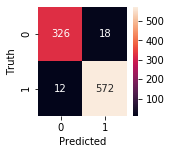

In [30]:
import seaborn as sn
plt.figure(figsize = (2,2))
sn.heatmap(con_matrix, annot = True, fmt = 'd')
plt.xlabel('Predicted')
plt.ylabel('Truth')